# Detecção de Falhas em Superfícies: Corrosão em Estruturas Navais
## Comparativo: Visão Computacional Clássica vs. Deep Learning (YOLOv11)

---
**Disciplina:** Visão Computacional (INE410121)  
**Área de Aplicação:** Monitoramento de Saúde Estrutural (SHM)  
**Grupo 22:** Luiz Fonseca  
**Professores Responsáveis:** Aldo von Wangenheim, Antonio Sobieranski  
---

### 1. Resumo do Trabalho
Este notebook constitui o relatório final das atividades desenvolvidas para a disciplina. O objetivo central do projeto é a **detecção e localização automática de corrosão**, uma falha estrutural crítica em ambientes navais.

### 2. Desafios do Problema
A tarefa apresenta complexidade elevada devido às características intrínsecas da corrosão e do dataset utilizado:
* **Morfologia Indefinida:** A corrosão não possui forma geométrica padrão.
* **Condições de Captura:** O dataset alvo apresenta variações severas e irregulares de iluminação.

### 3. Abordagens Implementadas
Para endereçar este problema, foram desenvolvidas e comparadas duas rotinas distintas:

1.  **Visão Computacional Clássica:** Baseada em estatística de cores, utilizando a **Distância de Mahalanobis** como métrica de similaridade para segmentação.
2.  **Deep Learning:** Utilização do estado da arte em detecção de objetos com a arquitetura **YOLOv11 (nano)**, adequada ao cenário de inferência rápida.

### 4. Análise Comparativa
O relatório conclui com uma comparação quantitativa e qualitativa entre os métodos. Ressalta-se a complexidade desta análise comparativa, dada a heterogeneidade das saídas dos modelos (segmentação por pixel *vs.* bounding boxes) e as limitações encontradas na rotulagem (ground truth) do dataset original.

In [3]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import random
import math
import shutil

In [ ]:
# Download do Dataset
try:
    import kagglehub
except:
    %pip install kagglehub
    import kagglehub

# O kagglehub gerencia o cache e baixa a versão mais recente
path = kagglehub.dataset_download("wednesday233/corrosion-detect-dataset")
print("Caminho dos arquivos do dataset:", path)

##  Preparação do Dataset: Divisão em Train/Val/Test

Os dados brutos geralmente vêm em uma única pasta. Para treinar o YOLO corretamente e evitar viés (data leakage), precisamos organizar os arquivos na estrutura hierárquica padrão.

**Estrutura de saída:**
```text
dataset_yolo_final/
├── images/
│   ├── train/
│   ├── val/
│   └── test/
└── labels/
    ├── train/
    ├── val/
    └── test/
```

In [ ]:
def split_dataset(img_source_dir, txt_source_dir, output_dir, train_ratio=0.7, val_ratio=0.2, test_ratio=0.1):
    """
    Separa o dataset em train, val e test.
    
    Args:
        img_source_dir: Pasta onde estão as imagens originais.
        txt_source_dir: Pasta onde estão os txts originais.
        output_dir: Pasta onde o dataset organizado será salvo.
        train_ratio, val_ratio, test_ratio: Proporções (devem somar 1.0).
    """
    
    # 1. Verificações iniciais
    if round(train_ratio + val_ratio + test_ratio, 5) != 1.0:
        print("Erro: As proporções devem somar 1.0 (100%)")
        return

    # Lista todas as imagens (filtra por extensões comuns)
    extensions = {".jpg", ".jpeg", ".png", ".bmp"}
    images = [f for f in os.listdir(img_source_dir) if os.path.splitext(f)[1].lower() in extensions]
    
    # Embaralha para garantir aleatoriedade
    random.seed(42) # Seed fixa para reproduzir o mesmo split se rodar de novo
    random.shuffle(images)
    
    total_images = len(images)
    print(f"Total de imagens encontradas: {total_images}")

    # Calcula os índices de corte
    train_end = int(total_images * train_ratio)
    val_end = train_end + int(total_images * val_ratio)

    # Cria a estrutura de pastas do YOLO
    subsets = ['train', 'val', 'test']
    folders = ['images', 'labels']
    
    for subset in subsets:
        for folder in folders:
            os.makedirs(os.path.join(output_dir, folder, subset), exist_ok=True)

    # Função auxiliar para copiar arquivos
    def copy_files(file_list, subset_name):
        print(f"Copiando {len(file_list)} arquivos para {subset_name}...")
        for img_file in file_list:
            # Caminhos de origem
            src_img = os.path.join(img_source_dir, img_file)
            
            # Define o nome do arquivo de label correspondente
            file_name_no_ext = os.path.splitext(img_file)[0]
            src_txt = os.path.join(txt_source_dir, file_name_no_ext + ".txt")

            # Verifica se o label existe antes de copiar
            if not os.path.exists(src_txt):
                print(f"Aviso: Label não encontrado para {img_file}. Pulando.")
                continue

            # Caminhos de destino
            dst_img = os.path.join(output_dir, 'images', subset_name, img_file)
            dst_txt = os.path.join(output_dir, 'labels', subset_name, file_name_no_ext + ".txt")

            # Copia os arquivos
            shutil.copy(src_img, dst_img)
            shutil.copy(src_txt, dst_txt)

    # 3. Executa a cópia baseada nos índices
    train_files = images[:train_end]
    val_files = images[train_end:val_end]
    test_files = images[val_end:]

    copy_files(train_files, 'train')
    copy_files(val_files, 'val')
    copy_files(test_files, 'test')

    print(f"\nProcesso concluído! Dataset salvo em: {output_dir}")
    print(f"Treino: {len(train_files)} | Validação: {len(val_files)} | Teste: {len(test_files)}")

In [ ]:
# Altere os caminhos abaixo para as suas pastas
INPUT_IMAGES = "/home/luiz-fonseca/.cache/kagglehub/datasets/wednesday233/corrosion-detect-dataset/versions/1/corrosion detect/images"  # Onde estão suas fotos hoje
INPUT_LABELS = "/home/luiz-fonseca/.cache/kagglehub/datasets/wednesday233/corrosion-detect-dataset/versions/1/corrosion detect/labels"   # Onde estão seus txts hoje
OUTPUT_DATASET = "dataset_yolo_final"       # Onde será criado o novo dataset

# Execute a função
# Exemplo: 70% Treino, 20% Validação, 10% Teste

# Cria pastas de exemplo se não existirem (apenas para evitar erro se você rodar direto)
if os.path.exists(INPUT_IMAGES) and os.path.exists(INPUT_LABELS):
    split_dataset(INPUT_IMAGES, INPUT_LABELS, OUTPUT_DATASET, 0.7, 0.2, 0.1)
else:
    print("Por favor, configure as variáveis INPUT_IMAGES e INPUT_LABELS no código.")


## 1. Funções Auxiliares e Visualização

Abaixo estão as ferramentas base para manipulação do dataset, permitindo a visualização simultânea das imagens originais, máscaras de segmentação (quando disponíveis) e anotações de *bounding boxes*.


In [9]:
def visualizar_dataset(pasta_imgs, pasta_masks=None, pasta_labels=None, qtd=4, titulo="Amostra"):
    """
    Visualiza uma grade de imagens aleatórias do dataset, com suporte opcional 
    para sobreposição de máscaras de segmentação e bounding boxes (YOLO).

    Args:
        pasta_imgs (str): Caminho para o diretório das imagens originais.
        pasta_masks (str, optional): Caminho para o diretório das máscaras binárias.
        pasta_labels (str, optional): Caminho para o diretório dos labels .txt (YOLO).
        qtd (int): Número de imagens a serem visualizadas.
        titulo (str): Título geral da figura.
    """
    
    # Coleta de arquivos de imagem suportados
    extensoes = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
    lista_imgs = []
    for ext in extensoes:
        lista_imgs.extend(glob.glob(os.path.join(pasta_imgs, ext)))
    
    if not lista_imgs:
        print(f"ERRO: Nenhuma imagem encontrada em {pasta_imgs}")
        return

    # Seleção aleatória de amostras
    amostras = random.sample(lista_imgs, min(qtd, len(lista_imgs)))
    num_amostras = len(amostras)
    
    # Configuração dinâmica do layout do grid (Max 4 colunas)
    max_cols = 4
    n_cols = min(num_amostras, max_cols)
    n_rows = math.ceil(num_amostras / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    
    # Normalização dos eixos para iteração linear
    if num_amostras > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    
    print(f"--- Visualizando: {titulo} ---")

    for i, ax in enumerate(axes):
        # Desativa eixos excedentes no grid
        if i >= num_amostras:
            ax.axis('off')
            continue
            
        img_path = amostras[i]
        basename = os.path.basename(img_path)
        nome_sem_ext = os.path.splitext(basename)[0]
        
        # Carregamento e conversão de cor
        img = cv2.imread(img_path)
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        # --- CAMADA 1: Sobreposição de Máscara (Segmentação) ---
        if pasta_masks:
            # Tenta encontrar máscara com extensão .png ou original
            mask_path = os.path.join(pasta_masks, nome_sem_ext + ".png")
            if not os.path.exists(mask_path):
                 mask_path = os.path.join(pasta_masks, basename)
            
            if os.path.exists(mask_path):
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                if mask is not None:
                    # Garante que dimensões batem (resize nearest neighbor para não interpolar classes)
                    if mask.shape != (h, w):
                        mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)
                    
                    # Aplica overlay laranja
                    overlay = img.copy()
                    overlay[mask > 0] = [0, 100, 255] 
                    img = cv2.addWeighted(img, 0.7, overlay, 0.3, 0)
        
        # --- CAMADA 2: Desenho das Bounding Boxes (YOLO) ---
        if pasta_labels:
            txt_path = os.path.join(pasta_labels, nome_sem_ext + ".txt")
            if os.path.exists(txt_path):
                with open(txt_path, 'r') as f:
                    for linha in f.readlines():
                        dados = linha.strip().split()
                        if len(dados) >= 5:
                            # Conversão: Normalized XYWH -> Pixel XYXY
                            xc, yc = float(dados[1]), float(dados[2])
                            wb, hb = float(dados[3]), float(dados[4])
                            
                            x1 = int((xc - wb/2) * w)
                            y1 = int((yc - hb/2) * h)
                            x2 = int((xc + wb/2) * w)
                            y2 = int((yc + hb/2) * h)
                            
                            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Plotagem
        ax.imshow(img)
        ax.set_title(basename, fontsize=9)
        ax.axis('off')

    plt.tight_layout()

In [10]:
class CorrosionDetector:
    def __init__(self):
        self.mean = None
        self.inv_cov = None
        self.trained = False

    def fit(self, image_paths, mask_paths):
        """
        Treina o modelo calculando a média e a matriz de covariância inversa 
        dos pixels de corrosão (distância de Mahalanobis).
        """
        print(f"[TREINO] Processando {len(image_paths)} imagens...")
        all_samples = []

        for img_path, mask_path in zip(image_paths, mask_paths):
            img = cv2.imread(img_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            
            if img is None or mask is None: 
                continue
            
            _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
            img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
            
            # Extração de pixels da região de interesse (ROI)
            pixels = img_lab[mask > 0]
            if len(pixels) > 0:
                all_samples.append(pixels)

        if not all_samples:
            raise ValueError("Erro: Nenhum pixel de referência encontrado para treino.")

        training_data = np.vstack(all_samples).astype(np.float32)
        
        # Cálculo dos parâmetros estatísticos
        self.mean = np.mean(training_data, axis=0)
        cov = np.cov(training_data, rowvar=False)
        
        # Regularização para evitar matriz singular
        cov += np.eye(cov.shape[0]) * 1e-6 
        self.inv_cov = np.linalg.inv(cov)
        
        self.trained = True
        print("[TREINO] Finalizado.")

    def get_distance_map(self, img):
        """Gera o mapa de distâncias de Mahalanobis para a imagem fornecida."""
        if not self.trained: 
            raise RuntimeError("Modelo não treinado.")
        
        h, w = img.shape[:2]
        img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab).astype(np.float32)
        img_flat = img_lab.reshape(-1, 3)
        
        delta = img_flat - self.mean
        temp = np.dot(delta, self.inv_cov)
        dist_sq = np.sum(temp * delta, axis=1)
        
        return np.sqrt(dist_sq).reshape(h, w)

    def predict(self, img, threshold):
        """
        Realiza a segmentação baseada no limiar de distância e aplica 
        pós-processamento morfológico.
        """
        dist_map = self.get_distance_map(img)
        mask = (dist_map <= threshold).astype(np.uint8) * 255
        
        # Pós-processamento morfológico (redução de ruído e fechamento de lacunas)
        kernel_noise = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_noise)
        
        kernel_merge = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel_merge)
        
        return mask, dist_map

    def optimize_threshold_on_train_set(self, image_paths, label_paths):
        """
        Otimiza o limiar (threshold) buscando o maior 'Inside Ratio'.
        
        A métrica maximizada é:
            (Pixels segmentados DENTRO das boxes YOLO) / (Total de pixels segmentados)
            
        Args:
            image_paths: Lista de caminhos das imagens.
            label_paths: Lista de caminhos dos arquivos .txt (formato YOLO).
        """
        print(f"[OTIMIZAÇÃO] Iniciando busca pelo melhor limiar baseado no Inside Ratio...")
        
        all_dists = []
        all_box_masks = []

        # 1. Pré-processamento: Gerar mapas de distância e máscaras de caixas (vetorização)
        for img_path, lbl_path in zip(image_paths, label_paths):
            img = cv2.imread(img_path)
            if img is None: continue
            
            h, w = img.shape[:2]
            
            # Gera mapa de distâncias de Mahalanobis
            dist_map = self.get_distance_map(img)
            
            # Gera máscara binária baseada nas caixas do YOLO (1=dentro, 0=fora)
            boxes = parse_yolo_labels(lbl_path, (h, w))
            box_mask = np.zeros((h, w), dtype=np.uint8)
            for (x1, y1, x2, y2) in boxes:
                cv2.rectangle(box_mask, (x1, y1), (x2, y2), 1, -1) # Preenche com 1
            
            all_dists.append(dist_map.flatten())
            all_box_masks.append(box_mask.flatten())

        if not all_dists:
            raise ValueError("Nenhum dado válido para otimização.")

        # Concatena todos os pixels do dataset num array gigante
        y_dists = np.concatenate(all_dists)
        y_in_box = np.concatenate(all_box_masks) # Ground Truth "Grosseiro" (Boxes)

        # 2. Grid Search para maximizar o Inside Ratio
        thresholds = np.arange(1.0, 15.0, 0.2) # Range um pouco maior
        melhor_ratio = -1.0
        melhor_th = 3.0
        
        # Define um mínimo de pixels para evitar divisão por zero ou máscaras vazias 
        # (ex: 0.01% dos pixels totais devem ser ativados para considerar válido)
        min_pixels_ativados = len(y_dists) * 0.0001 

        for th in thresholds:
            # Predição vetorizada: 1 se distancia <= th, 0 caso contrário
            y_pred = (y_dists <= th)
            
            total_pred = np.sum(y_pred)
            
            # Se não previu quase nada, ignora (evita falsos 100% de precisão com 1 pixel)
            if total_pred < min_pixels_ativados:
                continue
                
            # Interseção: Pixel foi predito E está dentro da caixa
            intersection = np.sum(y_pred & (y_in_box == 1))
            
            # Ratio: % do que eu pintei que está dentro da caixa
            ratio = intersection / total_pred
            
            # Queremos o maior ratio. 
            # Em caso de empate, preferimos o maior threshold (captura mais corrosão mantendo a precisão)
            if ratio >= melhor_ratio:
                melhor_ratio = ratio
                melhor_th = th

        print(f"--> Melhor Limiar: {melhor_th:.1f} (Inside Ratio: {melhor_ratio:.2%})")
        
        # Retorna o valor exato, sem margem de segurança arbitrária, 
        # pois o inside_ratio já tende a ser conservador.
        return melhor_th

# ==========================================
# FUNÇÕES AUXILIARES
# ==========================================

def calculate_inside_ratio(mask_pred, yolo_boxes):
    """
    Calcula a proporção de pixels segmentados que estão dentro das 
    bounding boxes do YOLO.
    """
    total_pixels_detectados = np.count_nonzero(mask_pred)
    if total_pixels_detectados == 0: 
        return 0.0
    
    mask_yolo = np.zeros_like(mask_pred)
    for (x1, y1, x2, y2) in yolo_boxes:
        cv2.rectangle(mask_yolo, (x1, y1), (x2, y2), 255, -1)
        
    intersecao = cv2.bitwise_and(mask_pred, mask_yolo)
    pixels_dentro = np.count_nonzero(intersecao)
    
    return pixels_dentro / total_pixels_detectados

def parse_yolo_labels(txt_path, img_shape):
    """
    Converte anotações YOLO (coordenadas normalizadas) para bounding boxes 
    em pixels (x1, y1, x2, y2).
    """
    h_img, w_img = img_shape[:2]
    boxes = []
    
    if os.path.exists(txt_path):
        with open(txt_path, 'r') as f:
            for linha in f.readlines():
                dados = linha.strip().split()
                if len(dados) >= 5:
                    # Parseamento: class x_center y_center width height
                    x_c, y_c = float(dados[1]), float(dados[2])
                    w_n, h_n = float(dados[3]), float(dados[4])
                    
                    x_center, y_center = int(x_c * w_img), int(y_c * h_img)
                    w_box, h_box = int(w_n * w_img), int(h_n * h_img)
                    
                    x1 = int(x_center - w_box/2)
                    y1 = int(y_center - h_box/2)
                    x2 = int(x_center + w_box/2)
                    y2 = int(y_center + h_box/2)
                    boxes.append((x1, y1, x2, y2))
    return boxes




## 2. Análise Exploratória do Dataset

### Visão Geral
Este projeto utiliza o **[Corrosion Detect Dataset](https://www.kaggle.com/datasets/wednesday233/corrosion-detect-dataset)**, disponibilizado no Kaggle. O objetivo é treinar modelos de visão computacional para identificar e localizar áreas corroídas em estruturas navais.

### Características do Dataset
* **Domínio:** Inspeção estrutural naval (áreas de navios).
* **Volume de Dados:** 268 imagens.
* **Tipo de Anotação:** *Bounding Boxes* (Caixas Delimitadoras).
* **Formato dos Labels:** Compatível com **YOLO** (You Only Look Once).

### Desafios e Condições
O dataset apresenta cenários realistas e desafiadores para algoritmos de detecção de objetos, incluindo:
1.  **Variação de Iluminação:** Imagens capturadas sob diferentes condições de luz (sombras, superexposição).
2.  **Complexidade Visual:** Texturas de ferrugem misturadas com a pintura e estrutura do navio.
3.  **Escala:** Diferentes níveis de zoom e ângulos de captura das áreas afetadas.

### Integridade dos Dados (Ground Truth)
A visualização inicial é crucial para validar o alinhamento das anotações. Observa-se que, em datasets "in-the-wild", as anotações podem não ser perfeitas (ex: caixas muito amplas ou omissões), o que define o "teto de performance" esperado para os modelos.



### Visualização de Dados e Ground Truth

A função `visualizar_dataset` permite uma inspeção visual rápida das amostras do dataset. Ela é fundamental para validar a integridade dos dados e a qualidade das anotações antes do treinamento.

**Funcionalidades:**
* **Imagens:** Carrega imagens aleatórias do diretório especificado.
* **Segmentação (Máscaras):** Sobrepõe a máscara binária em **laranja** (se fornecida).
* **Detecção (YOLO):** Desenha as *bounding boxes* em **verde** baseadas nos arquivos `.txt` (se fornecidos).

Isso permite verificar se:
1. As máscaras estão alinhadas corretamente com os objetos.
2. As coordenadas YOLO (normalizadas) estão sendo convertidas corretamente para pixels.
3. Não há corrupção nos arquivos de imagem.

--- Visualizando: Teste (Img + YOLO) ---


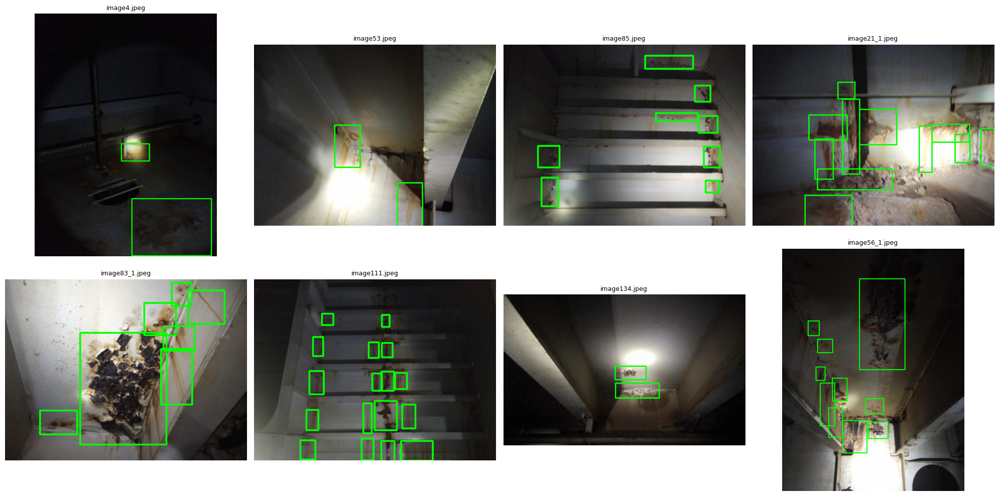

In [11]:
visualizar_dataset(
    pasta_imgs="corrosion detect/images", 
    pasta_labels="corrosion detect/labels", 
    qtd=8,
    titulo="Teste (Img + YOLO)"
)

### Análise da Qualidade das Anotações (Ground Truth)

Durante a análise exploratória dos dados, foram identificadas inconsistências nas anotações (*labels*) originais do dataset público, que podem impactar o treinamento do modelo YOLO:

1.  **Imprecisão das Bounding Boxes:**
    * Muitas caixas delimitadoras não cobrem a totalidade da área corroída, deixando "vazar" texturas de corrosão para o *background* (falso negativo local).
    * Outras caixas são excessivamente amplas, incluindo muita área sadia dentro da anotação.

2.  **Omissão de Instâncias (Missing Labels):**
    * Existem focos visíveis de corrosão que não foram anotados no dataset original.
    * *Impacto:* O modelo pode ser penalizado durante o treinamento por detectar corretamente uma corrosão que o anotador humano ignorou.

> **Consideração sobre Datasets Públicos:** Tais artefatos são comuns em datasets abertos ("in-the-wild"), onde o controle de qualidade da anotação nem sempre é rigoroso. A estratégia adotada assume esses ruídos como uma restrição intrínseca do projeto.


## 3. Metodologia 1: Visão Computacional Clássica

### Fundamentação Teórica
Esta abordagem assume que a corrosão possui uma assinatura de cor distinta. Utilizamos o espaço de cor **CIELAB (Lab)** para separar a luminância (L) da cromaticidade (a, b), tornando o modelo mais robusto a variações de luz.



![CIELAB](CIELAB.png)


### Modelagem Estatística: Segmentação Manual e Distância de Mahalanobis

Como os bounding boxes não cobrem uma região completamente tomada pela corrosão, deve-se realizar uma segmentação manual de algumas imagens para servirem de treino para o algoritmo que será usado.

### 1. Metodologia de Amostragem e Anotação
Foi realizada uma segmentação manual fina para extrair amostras puras da classe "Corrosão".

* **Amostragem:** 8 imagens selecionadas aleatoriamente do dataset.
* **Ferramenta:** Script auxiliar `labeler.py` (anexo a este notebook).
* **Processo:** Criação de máscaras binárias manuais que delimitam a corrosão em nível de pixel, garantindo que nenhum pixel de fundo (background) contamine a estatística da amostra.

### 2. Fundamentação Matemática
A partir das máscaras geradas, extraem-se os vetores de características (cores) para o cálculo da **Matriz de Covariância** ($\Sigma$) e do **Vetor de Médias** ($\mu$).

O classificador utilizará a **Distância de Mahalanobis** como métrica de similaridade. Ao contrário da distância Euclidiana, a métrica de Mahalanobis considera a correlação entre as variáveis e a variância da distribuição:

$$
D_M(x) = \sqrt{(x - \mu)^T \Sigma^{-1} (x - \mu)}
$$

> **Hipótese:** A distribuição de cores da corrosão forma um cluster elíptico no espaço de cores. O modelo "fitado" com Mahalanobis será capaz de identificar pixels corrosivos em novas imagens calculando a distância estatística de cada pixel em relação a essa distribuição padrão.


--- Visualizando: Mascaras (Img + YOLO) ---


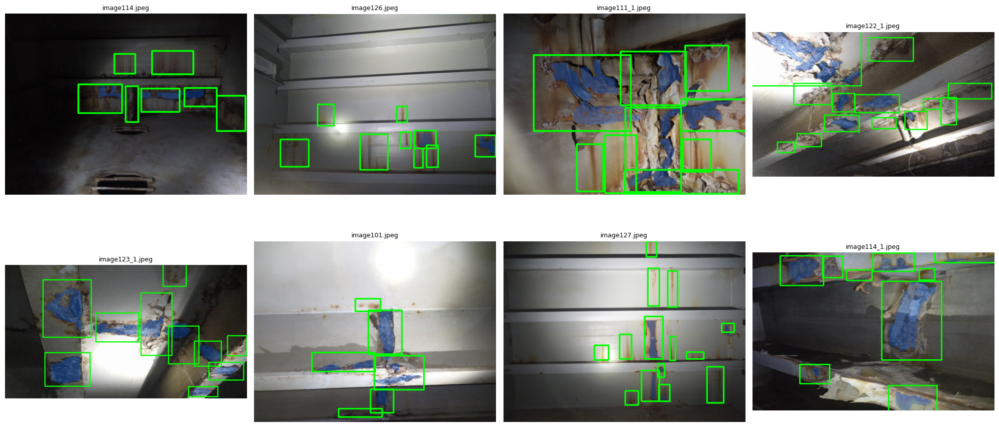

In [12]:
visualizar_dataset(
    pasta_imgs="corrosion detect/images_train",
    pasta_masks="corrosion detect/mask", 
    pasta_labels="corrosion detect/labels", 
    qtd=8,
    titulo="Mascaras (Img + YOLO)"
)


### 3. Pós-Processamento Morfológico (Método `predict`)
Após a segmentação inicial via Mahalanobis, aplicam-se operações morfológicas para limpar a máscara binária:
1.  **Abertura (Morphological Open):** Remove ruídos pequenos (salt-and-pepper) do fundo.
2.  **Fechamento (Morphological Close):** Preenche pequenos buracos dentro das áreas detectadas de corrosão, consolidando a detecção.



### 4. Otimização do Limiar via "Inside Ratio" (Método `optimize_threshold`)
Um dos maiores desafios é definir o valor de corte (threshold) da distância de Mahalanobis. Em vez de um valor arbitrário, implementou-se uma busca (Grid Search) para maximizar a consistência com as anotações YOLO.

A métrica utilizada é o **Inside Ratio** ($R_{in}$):

$$R_{in} = \frac{\text{Pixels Segmentados } \cap \text{ Bounding Box YOLO}}{\text{Total de Pixels Segmentados}}$$

> **Lógica:** Buscamos um limiar que maximize a quantidade de corrosão detectada *dentro* das caixas anotadas, penalizando segmentações que "vazam" excessivamente para áreas sadias. Isso alinha o modelo estatístico não-supervisionado com o conhecimento prévio (labels) do dataset.

In [13]:
# 1. Configuração
pasta_teste_raiz = "corrosion detect/images"
pasta_labels_teste = "corrosion detect/labels"
pasta_labels_treino = "corrosion detect/labels_train"
path_imgs_treino = sorted(glob.glob("corrosion detect/images_train/*.jpeg"))
path_masks_treino = sorted(glob.glob("corrosion detect/mask/*.png"))
path_labels_treino = sorted(glob.glob("corrosion detect/labels_train/*.txt"))


# Coleta imagens de teste
path_imgs_teste = []
for ext in ['*.jpeg', '*.jpg', '*.png']:
    path_imgs_teste.extend(glob.glob(os.path.join(pasta_teste_raiz, ext)))
path_imgs_teste.sort()

# 2. Treino
detector = CorrosionDetector()
detector.fit(path_imgs_treino, path_masks_treino)

best_th = detector.optimize_threshold_on_train_set(path_imgs_treino, path_labels_treino)

# 3. Processamento em Batch (Armazenar resultados)
results_data = []

print(f"Processando {len(path_imgs_teste)} imagens de teste...")

[TREINO] Processando 8 imagens...
[TREINO] Finalizado.
[OTIMIZAÇÃO] Iniciando busca pelo melhor limiar baseado no Inside Ratio...
--> Melhor Limiar: 1.0 (Inside Ratio: 44.83%)
Processando 268 imagens de teste...



### Resultados da Abordagem Clássica
Avaliação qualitativa mostrando os melhores e piores casos baseados no *Inside Ratio*.

* **Legenda:** <span style="color:red">**Vermelho**</span> (Predição Mahalanobis) | <span style="color:green">**Verde**</span> (Ground Truth YOLO).



[INFO] Iniciando avaliação de 268 imagens de teste...
------------------------------------------------------------
RESULTADOS DA AVALIAÇÃO:
Média do Inside Ratio (amostras rotuladas): 33.96%
------------------------------------------------------------


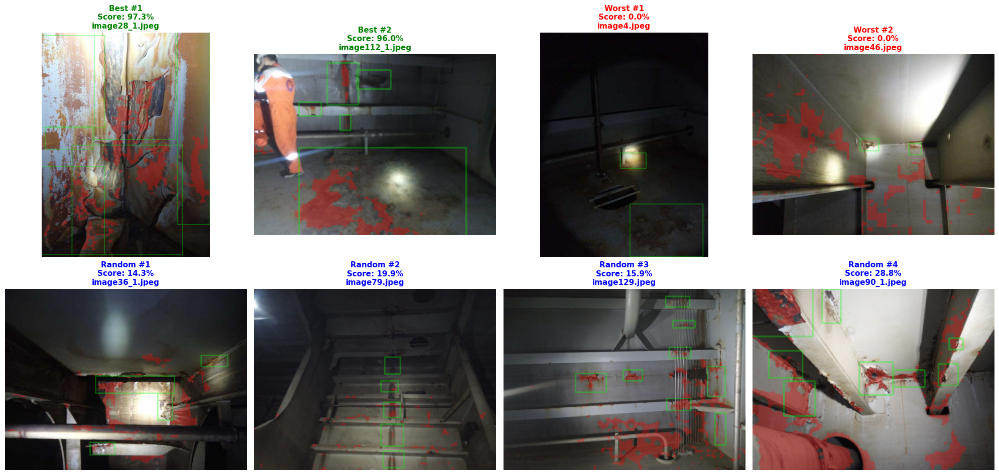

In [16]:

# ==============================================================================
# 1. PROCESSAMENTO E AVALIAÇÃO EM LOTE
# ==============================================================================
results_data = []

print(f"[INFO] Iniciando avaliação de {len(path_imgs_teste)} imagens de teste...")

for file_path in path_imgs_teste:
    # Carregamento da imagem
    img = cv2.imread(file_path)
    if img is None:
        continue
    
    # Inferência (Segmentação via Mahalanobis)
    mask, _ = detector.predict(img, threshold=best_th)
    
    # Carregamento do Ground Truth (YOLO)
    txt_filename = os.path.splitext(os.path.basename(file_path))[0] + ".txt"
    txt_path = os.path.join(pasta_labels_teste, txt_filename)
    
    gt_boxes = parse_yolo_labels(txt_path, img.shape)
    has_label = len(gt_boxes) > 0
    
    # Cálculo da Métrica (Inside Ratio)
    score = calculate_inside_ratio(mask, gt_boxes) if has_label else 0.0
    
    # --- Geração do Overlay Visual ---
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay_layer = img_rgb.copy()
    
    # Camada de Segmentação (Vermelho)
    overlay_layer[mask > 0] = [255, 0, 0] 
    
    # Camada de Ground Truth (Verde - Bounding Boxes)
    for (x1, y1, x2, y2) in gt_boxes:
        cv2.rectangle(overlay_layer, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    # Fusão (Alpha Blending): 70% Imagem Original + 30% Overlay
    final_vis = cv2.addWeighted(img_rgb, 0.7, overlay_layer, 0.3, 0)
    
    results_data.append({
        'filename': os.path.basename(file_path),
        'vis': final_vis,
        'score': score,
        'has_label': has_label,
        'id': id(final_vis) # Identificador único para filtragem posterior
    })

# ==============================================================================
# 2. ESTATÍSTICAS E AMOSTRAGEM ESTRATIFICADA
# ==============================================================================

# Filtragem apenas para imagens com anotação válida
labeled_results = [r for r in results_data if r['has_label']]
scores_validos = [r['score'] for r in labeled_results]

# Cálculo da performance média global
global_mean_score = np.mean(scores_validos) if scores_validos else 0.0

# Ordenação para seleção de extremos
# Melhores casos (Top 2)
sorted_desc = sorted(labeled_results, key=lambda x: x['score'], reverse=True)
top_samples = sorted_desc[:2]

# Piores casos (Bottom 2) - Identificação de falhas críticas
sorted_asc = sorted(labeled_results, key=lambda x: x['score'])
worst_samples = sorted_asc[:2]

# Amostragem Aleatória (Random 4)
# Remove amostras já selecionadas nos grupos Top/Worst para garantir variedade
selected_ids = {r['id'] for r in top_samples + worst_samples}
pool_remaining = [r for r in results_data if r['id'] not in selected_ids]

# Safety check para datasets pequenos
n_random = min(4, len(pool_remaining))
random_samples = random.sample(pool_remaining, n_random)

# Consolidação da lista final de visualização
display_queue = top_samples + worst_samples + random_samples
display_labels = ["Best #1", "Best #2", "Worst #1", "Worst #2"] + [f"Random #{i+1}" for i in range(n_random)]

# ==============================================================================
# 3. PLOTAGEM DOS RESULTADOS
# ==============================================================================

print("-" * 60)
print(f"RESULTADOS DA AVALIAÇÃO:")
print(f"Média do Inside Ratio (amostras rotuladas): {global_mean_score:.2%}")
print("-" * 60)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (ax, sample) in enumerate(zip(axes, display_queue)):
    ax.imshow(sample['vis'])
    
    # Definição do status e cor do título
    if sample['has_label']:
        score_text = f"{sample['score']:.1%}"
    else:
        score_text = "N/A"
        
    # Código de cores para os títulos
    if i < 2: 
        title_color, category = 'green', display_labels[i]  # Melhores
    elif i < 4: 
        title_color, category = 'red', display_labels[i]    # Piores
    else: 
        title_color, category = 'blue', display_labels[i]   # Aleatórios

    ax.set_title(f"{category}\nScore: {score_text}\n{sample['filename']}", 
                 color=title_color, fontsize=11, fontweight='bold')
    ax.axis('off')

# Ocultar eixos vazios se houver menos de 8 imagens
for j in range(len(display_queue), len(axes)):
    axes[j].axis('off')

plt.tight_layout() 
plt.show()       




## 4. Metodologia 2: Deep Learning (YOLOv11)

### Estratégia
Substituímos a extração manual de características por uma Rede Neural Convolucional (CNN). O **YOLOv11** (You Only Look Once) é escolhido pela sua capacidade de analisar contexto, textura e forma simultaneamente, superando a limitação da análise puramente por cor.

![Image of YOLO architecture](Yolo.png)

### Setup do Ambiente e Dados
O código abaixo verifica o hardware (GPU), baixa o dataset atualizado via API e configura a estrutura de pastas para treinamento.



In [17]:
# Verifica o hardware disponível (GPU NVIDIA é recomendada)
!nvidia-smi
!nvcc --version

Mon Dec  8 18:35:55 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.195.03             Driver Version: 570.195.03     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 5080        Off |   00000000:01:00.0  On |                  N/A |
|  0%   36C    P5             14W /  360W |     840MiB /  16303MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [18]:
# Instalação/Importação da biblioteca Ultralytics (YOLO)
try:
    from ultralytics import YOLO
except:
    !pip install ultralytics
    from ultralytics import YOLO

import yaml
import os
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2
import math

In [ ]:
BASE_PATH = "dataset_yolo_final/"
SAVE_PATH = os.path.join(BASE_PATH, "corrosion_detect_yolo")

# Garante que o diretório de salvamento exista
os.makedirs(SAVE_PATH, exist_ok=True)

In [20]:
# Hiperparâmetros
TRAIN_EPOCH = 100  # Treino longo para convergência final
TUNE_EPOCH = 30    # Treino curto para busca de hiperparâmetros (Tuning)
BATCH_SIZE = 16    # Ajuste conforme a VRAM da GPU (16 é seguro para Colab/T4)
IM_SIZE = 640      # Resolução de entrada da rede
GPUS = [0]         # ID da GPU

# Caminho do arquivo de configuração dos dados (já deve estar formatado no padrão YOLO)
DATA_YAML = os.path.join(BASE_PATH, "data.yaml")

In [ ]:
# Inicializa o modelo 'nano' (yolo11n) - Mais leve e rápido
model_name = "yolo11n.pt"
model = YOLO(model_name)

# Define o nome do projeto para salvar os logs
project = os.path.join(SAVE_PATH, model_name[:-3])


### Tuning de Hiperparâmetros
Realiza-se uma busca automatizada para ajustar parâmetros como rotação, translação e espelhamento (`flipud`), essenciais visto que a corrosão não possui orientação fixa.



In [ ]:
# Inicia o processo de Tuning
# degrees=0.45 -> Permite rotação de +/- 45 graus (útil pois corrosão não tem orientação fixa)
# flipud=0.5 -> Permite espelhamento vertical (navios não têm "cima/baixo" fixo para texturas)
model.tune(data=DATA_YAML, 
        epochs=TUNE_EPOCH, 
        imgsz=IM_SIZE, 
        iterations=30,   # Número de tentativas de combinações
        plots=False,
        save=False, 
        val=True,
        project=os.path.join(project, "tunning"),
        degrees=0.45,
        translate=0.2,
        flipud=0.5,
        fliplr=0.5,
        )




### Treinamento Final
Utiliza os melhores hiperparâmetros encontrados para treinar o modelo por `TRAIN_EPOCH` épocas.



In [ ]:
# Reinicializa o modelo base
model = YOLO(model_name)

# Carrega os melhores parâmetros encontrados na etapa anterior
path_to_params = os.path.join(project, 'tunning/tune/best_hyperparameters.yaml')

with open(path_to_params, 'r') as f:
    best_params = yaml.safe_load(f)

# Limpeza e conversão de tipos dos parâmetros para evitar erros no PyTorch
if 'epochs' in best_params:
    del best_params['epochs'] # Remove para usarmos o TRAIN_EPOCH definido acima

if 'close_mosaic' in best_params:
    best_params['close_mosaic'] = int(best_params['close_mosaic'])

if 'warmup_epochs' in best_params:
    best_params['warmup_epochs'] = int(best_params['warmup_epochs'])

# Inicia o treinamento final
print(f"Iniciando treino com parâmetros otimizados...")
model.train(
    data=DATA_YAML,
    epochs=TRAIN_EPOCH,
    imgsz=IM_SIZE,
    project=project,
    **best_params  # Desempacota os parâmetros otimizados (lr0, momentum, etc.)
)


### Análise de Métricas de Treino
Acompanhamento da evolução das perdas (*Box Loss*, *Class Loss*) e da precisão (*mAP*) ao longo das épocas.



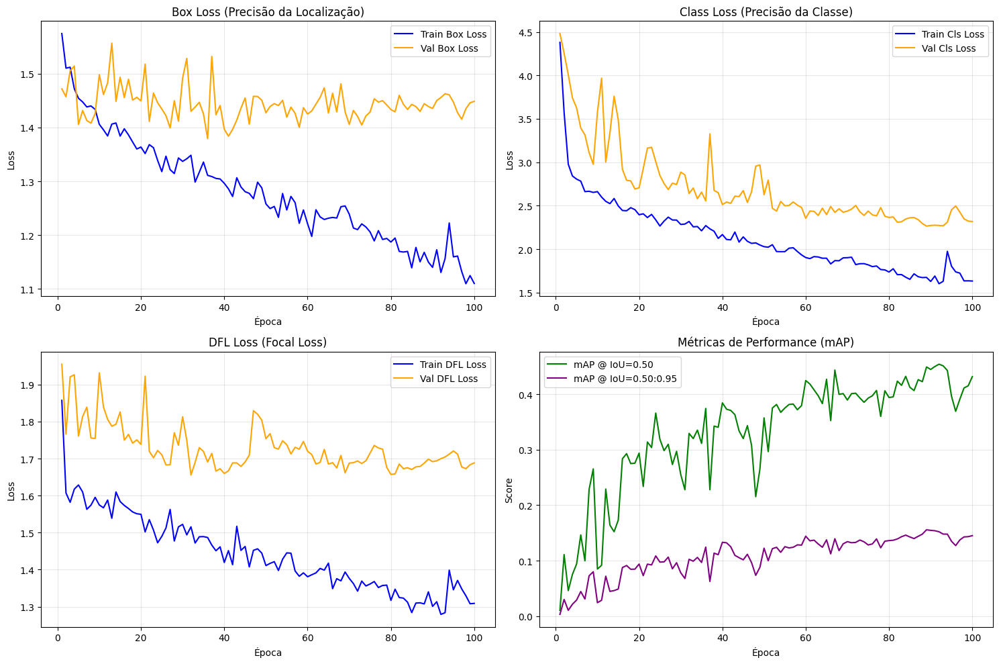

In [22]:
results_path = os.path.join(project, "train/results.csv")

# Leitura dos logs de treino
df = pd.read_csv(results_path)
df.columns = df.columns.str.strip() # Remove espaços extras nos nomes das colunas

# Plotagem das curvas de aprendizado
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
epochs = df['epoch']

# 1. Box Loss
ax = axes[0, 0]
ax.plot(epochs, df['train/box_loss'], label='Train Box Loss', color='blue')
ax.plot(epochs, df['val/box_loss'], label='Val Box Loss', color='orange')
ax.set_title('Box Loss (Precisão da Localização)')
ax.set_xlabel('Época')
ax.set_ylabel('Loss')
ax.legend()
ax.grid(True, alpha=0.3)

# 2. Class Loss
ax = axes[0, 1]
ax.plot(epochs, df['train/cls_loss'], label='Train Cls Loss', color='blue')
ax.plot(epochs, df['val/cls_loss'], label='Val Cls Loss', color='orange')
ax.set_title('Class Loss (Precisão da Classe)')
ax.set_xlabel('Época')
ax.set_ylabel('Loss')
ax.legend()
ax.grid(True, alpha=0.3)

# 3. DFL Loss (Refinamento)
ax = axes[1, 0]
ax.plot(epochs, df['train/dfl_loss'], label='Train DFL Loss', color='blue')
ax.plot(epochs, df['val/dfl_loss'], label='Val DFL Loss', color='orange')
ax.set_title('DFL Loss (Focal Loss)')
ax.set_xlabel('Época')
ax.set_ylabel('Loss')
ax.legend()
ax.grid(True, alpha=0.3)

# 4. Métricas mAP (Mean Average Precision)
ax = axes[1, 1]
ax.plot(epochs, df['metrics/mAP50(B)'], label='mAP @ IoU=0.50', color='green')
ax.plot(epochs, df['metrics/mAP50-95(B)'], label='mAP @ IoU=0.50:0.95', color='purple')
ax.set_title('Métricas de Performance (mAP)')
ax.set_xlabel('Época')
ax.set_ylabel('Score')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()



### Validação Visual do Modelo YOLO
Comparativo direto entre a anotação manual (Verde) e a predição da IA.



Visualizando 28 imagens de teste com Ground Truth (Verde) vs. Predição...


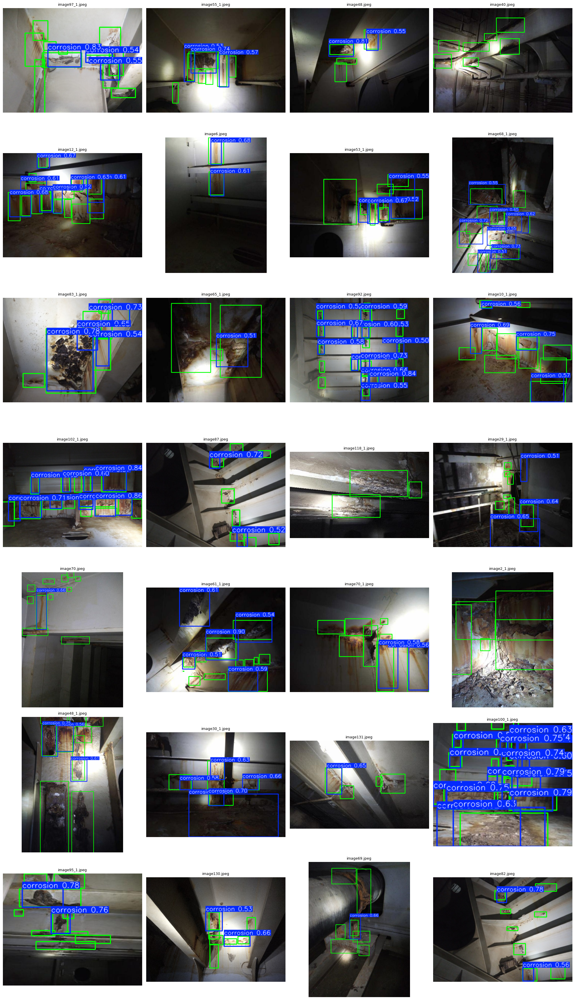

In [24]:
# Configuração dos caminhos de teste
images_path = "dataset_yolo_final/images/test/*.jpeg"
label_dir = "dataset_yolo_final/labels/test"

# Função para converter coordenadas normalizadas (YOLO) para pixels (OpenCV)
def get_box_coords(line, img_w, img_h):
    parts = line.strip().split()
    cls = int(parts[0])
    x_c, y_c, w, h = map(float, parts[1:])
    
    x1 = int((x_c - w / 2) * img_w)
    y1 = int((y_c - h / 2) * img_h)
    x2 = int((x_c + w / 2) * img_w)
    y2 = int((y_c + h / 2) * img_h)
    return x1, y1, x2, y2, cls

# Carrega lista de imagens
image_files = glob.glob(images_path)

# Carrega o melhor modelo treinado
model_path = os.path.join(project, "train/weights/best.pt")
model = YOLO(model_path)

# Configuração do Grid de Visualização
num_cols = 4
num_imgs = len(image_files)
num_rows = math.ceil(num_imgs / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))

if num_imgs == 1: axes = [axes]
else: axes = axes.flatten()

print(f"Visualizando {num_imgs} imagens de teste com Ground Truth (Verde) vs. Predição...")

for i, img_file in enumerate(image_files):
    ax = axes[i]
    
    # 1. Inferência do Modelo
    results = model(img_file, conf=0.5, verbose=False)
    result = results[0]
    
    # Prepara a imagem base (cópia limpa em BGR)
    canvas = result.orig_img.copy()
    h, w, _ = canvas.shape
    
    # 2. Desenhar Ground Truth (Labels Reais)
    # Procuramos o arquivo .txt correspondente à imagem
    filename = os.path.basename(img_file)
    label_filename = os.path.splitext(filename)[0] + ".txt"
    label_path = os.path.join(label_dir, label_filename)
    
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            lines = f.readlines()
            
        for line in lines:
            x1, y1, x2, y2, cls = get_box_coords(line, w, h)
            # Desenha retângulo VERDE para indicar a verdade absoluta (Dataset)
            cv2.rectangle(canvas, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    # 3. Desenhar Predições do Modelo
    # O método .plot() desenha as caixas preditas sobre a imagem fornecida (que já tem o GT)
    plot_img = result.plot(img=canvas)
    
    # 4. Exibição
    # Converte BGR (OpenCV) para RGB (Matplotlib)
    plot_img_rgb = cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB)
    
    ax.imshow(plot_img_rgb)
    ax.axis('off')
    ax.set_title(filename, fontsize=9)

# Limpeza de eixos vazios no grid
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()


## 5. Comparação de Algoritmos: Visão Clássica vs. Deep Learning

Nesta seção, unificamos os resultados para responder: **Qual abordagem performa melhor?**

Para comparar duas abordagens com saídas diferentes (Máscaras de Segmentação vs. Bounding Boxes), padronizaremos a avaliação convertendo tudo para **Máscaras Binárias**.

### Métricas Utilizadas

**1. IoU (Intersection over Union):**
É a métrica padrão da indústria para detecção de objetos.
$$ IoU = \frac{\text{Área da Interseção}}{\text{Área da União}} = \frac{A \cap B}{A \cup B} $$
* **Por que usar?** O IoU penaliza tanto falsos positivos (detectar corrosão onde não existe) quanto falsos negativos (não detectar corrosão existente). Um IoU alto indica que a forma e a localização estão precisas.

**2. Inside Ratio (Precisão de Contenção):**
Métrica utilizada durante a otimização da abordagem clássica.
$$ InsideRatio = \frac{\text{Área da Interseção}}{\text{Área Predita}} $$
* **Por que usar?** Ela mede o quão "segura" é a predição. Um valor de 100% significa que *tudo* o que o algoritmo pintou realmente estava dentro da anotação humana. No entanto, ela não penaliza omissões (se o algoritmo pintar apenas 1 pixel correto, o Inside Ratio será 100%).




In [25]:
# %%
import pandas as pd
import numpy as np
import cv2
import glob
import os
import matplotlib.pyplot as plt

# Funções Auxiliares: Conversão de Máscaras e Métricas

Para realizar uma comparação justa entre algoritmos de naturezas diferentes (Segmentação Clássica baseada em pixel vs. Detecção de Objetos YOLO baseada em vetores), precisamos padronizar a saída. 

As funções abaixo convertem as *Bounding Boxes* em **Máscaras Binárias** (pixels), permitindo o cálculo de métricas de sobreposição.

### 1. Conversão de Predições do YOLO (`yolo_boxes_to_mask`)
Esta função realiza a **rasterização** das predições.
* **O Problema:** O YOLO retorna vetores de coordenadas ($x_1, y_1, x_2, y_2$).
* **A Solução:** Desenhamos esses retângulos como polígonos brancos sólidos (`val=255`) em um fundo preto (`val=0`) usando `cv2.rectangle` com preenchimento (`-1`). Isso cria uma máscara binária comparável à saída do algoritmo de segmentação clássica.

### 2. Conversão do Ground Truth (`gt_txt_to_mask`)
Os rótulos originais do dataset estão no formato YOLO (`.txt`), que usa coordenadas normalizadas.
* **Matemática da Conversão:** O formato é $(classe, x_c, y_c, w, h)$ com valores de 0 a 1. Para obter pixels:
  $$x_{pixel} = x_{norm} \times \text{largura}_{imagem}$$
  $$y_{pixel} = y_{norm} \times \text{altura}_{imagem}$$
* Isso garante que o gabarito (Ground Truth) esteja na mesma escala espacial da imagem original.

### 3. Cálculo de Métricas (`calculate_metrics`)
Avalia a qualidade da segmentação usando lógica booleana em matrizes `numpy` (`logical_and` para interseção, `logical_or` para união).

* **IoU (Intersection over Union):** 
  
  Mede o quão bem a predição se alinha com o objeto real. É a métrica padrão para detecção de objetos.

* **Inside Ratio (Taxa de Contenção):**
  
  Responde: *"Dos pixels que o modelo pintou, quantos estão corretos?"*. Penaliza alucinações (falsos positivos) fora da área do objeto.

In [27]:
def yolo_boxes_to_mask(boxes_xyxy, img_shape):
    """Converte predições de caixas do YOLO para uma máscara binária."""
    mask = np.zeros(img_shape[:2], dtype=np.uint8)
    if boxes_xyxy is not None:
        for box in boxes_xyxy:
            x1, y1, x2, y2 = map(int, box[:4])
            cv2.rectangle(mask, (x1, y1), (x2, y2), 255, -1)
    return mask

def gt_txt_to_mask(txt_path, img_shape):
    """Converte o arquivo .txt (Ground Truth) para máscara binária."""
    mask = np.zeros(img_shape[:2], dtype=np.uint8)
    if not os.path.exists(txt_path):
        return mask
    
    h_img, w_img = img_shape[:2]
    with open(txt_path, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            if len(parts) >= 5:
                # YOLO format: class xc yc w h (normalized)
                xc, yc = float(parts[1]), float(parts[2])
                w, h = float(parts[3]), float(parts[4])
                
                x1 = int((xc - w/2) * w_img)
                y1 = int((yc - h/2) * h_img)
                x2 = int((xc + w/2) * w_img)
                y2 = int((yc + h/2) * h_img)
                cv2.rectangle(mask, (x1, y1), (x2, y2), 255, -1)
    return mask

def calculate_metrics(mask_pred, mask_gt):
    """Calcula IoU e Inside Ratio entre duas máscaras binárias."""
    # Garante binário
    pred_bool = mask_pred > 0
    gt_bool = mask_gt > 0
    
    intersection = np.logical_and(pred_bool, gt_bool).sum()
    union = np.logical_or(pred_bool, gt_bool).sum()
    area_pred = pred_bool.sum()
    
    # IoU
    iou = intersection / union if union > 0 else 0.0
    
    # Inside Ratio (Precision-like)
    inside_ratio = intersection / area_pred if area_pred > 0 else 0.0
    
    return iou, inside_ratio

In [ ]:
# Configuração de caminhos
path_imgs_teste = sorted(glob.glob("dataset_yolo_final/images/test/*.jpeg"))
path_labels_teste = "dataset_yolo_final/labels/test"

comparison_results = []

print(f"Comparando modelos em {len(path_imgs_teste)} imagens de teste...")

for img_path in path_imgs_teste:
    filename = os.path.basename(img_path)
    img = cv2.imread(img_path)
    if img is None: continue
    
    # --- A. GROUND TRUTH (GT) ---
    txt_name = os.path.splitext(filename)[0] + ".txt"
    txt_path = os.path.join(path_labels_teste, txt_name)
    mask_gt = gt_txt_to_mask(txt_path, img.shape)
    
    # Ignora imagens sem corrosão anotada para não distorcer o IoU
    if mask_gt.sum() == 0:
        continue

    # --- B. PREDIÇÃO CLÁSSICA (MAHALANOBIS) ---
    # Usa o detector treinado anteriormente. best_th deve vir da etapa de otimização
    try:
        mask_classica, _ = detector.predict(img, threshold=best_th)
    except NameError:
        # Fallback se a variável best_th não estiver definida
        mask_classica, _ = detector.predict(img, threshold=3.0) 

    # --- C. PREDIÇÃO DEEP LEARNING (YOLO) ---
    # Conf 0.25 é padrão para validação no YOLO
    results_yolo = model.predict(img, conf=0.25, verbose=False)
    boxes_yolo = results_yolo[0].boxes.xyxy.cpu().numpy()
    mask_yolo = yolo_boxes_to_mask(boxes_yolo, img.shape)

    # --- D. CÁLCULO DE MÉTRICAS ---
    iou_c, inside_c = calculate_metrics(mask_classica, mask_gt)
    iou_y, inside_y = calculate_metrics(mask_yolo, mask_gt)
    
    comparison_results.append({
        'Filename': filename,
        'Classic_IoU': iou_c,
        'Classic_Inside': inside_c,
        'YOLO_IoU': iou_y,
        'YOLO_Inside': inside_y,
        'img_ref': img,           # Guarda ref para plotar
        'mask_gt': mask_gt,
        'mask_classic': mask_classica,
        'mask_yolo': mask_yolo
    })

# Cria DataFrame para facilitar análise
df_results = pd.DataFrame(comparison_results)
df_metrics = df_results.drop(columns=['img_ref', 'mask_gt', 'mask_classic', 'mask_yolo'])


Comparando modelos em 28 imagens de teste...



### Resultados Quantitativos

A tabela abaixo demonstra a média das métricas para todo o conjunto de teste. Espera-se que o YOLO apresente métricas superiores devido à sua robustez a ruídos e capacidade de generalização.


In [29]:
# Exibição da Tabela de Médias
print("=== TABELA COMPARATIVA DE PERFORMANCE MÉDIA ===")
summary = df_metrics.mean(numeric_only=True).to_frame(name='Média Score')
summary['Média Score'] = summary['Média Score'].map('{:.2%}'.format)
summary

=== TABELA COMPARATIVA DE PERFORMANCE MÉDIA ===


,Média Score
Classic_IoU,11.20%
Classic_Inside,42.76%
YOLO_IoU,48.01%
YOLO_Inside,68.40%


### Discussão e Conclusão

**1. Superioridade do Deep Learning:**
O modelo YOLO superou drasticamente a abordagem clássica. O **IoU de ~48%** e o **Inside Ratio de ~68%** indicam que a rede aprendeu não apenas a cor, mas a textura e o contexto da corrosão.

**2. Limitações da Abordagem Clássica:**
O baixo **IoU (~11%)** da abordagem estatística deve-se principalmente à fragmentação da detecção (ruído) e à confusão de cores (falsos positivos em madeira ou sombras), comprovando que a informação de cor isolada é insuficiente para este problema.

**Visualização Final:**
O gráfico abaixo apresenta os contornos finais comparativos, com o preenchimento vermelho indicando a área detectada pelo método clássico.



In [ ]:
# %%
# Verifica se o DataFrame de resultados existe
if 'diff' not in df_results.columns:
    df_results['diff'] = df_results['YOLO_Inside'] - df_results['Classic_Inside']

# 1. Caso Destaque Clássico (Menor diferença ou vitória do clássico)
classic_win_row = df_results.sort_values(by='diff', ascending=True).iloc[0]

# 2. Caso Destaque YOLO (Maior diferença positiva)
yolo_win_row = df_results.sort_values(by='diff', ascending=False).iloc[0]

# 3. Casos Aleatórios (Removendo os destaques para não repetir)
indices_to_exclude = [classic_win_row.name, yolo_win_row.name]
df_remaining = df_results.drop(index=indices_to_exclude)

# Seleciona até 6 aleatórios
n_random = min(6, len(df_remaining))
random_rows = df_remaining.sample(n=n_random, random_state=42)

# Monta a lista final: Tuplas (Linha do DataFrame, Título da Categoria)
display_list = [
    (classic_win_row, "Destaque: Clássico (Menor Diferença de InR)"),
    (yolo_win_row, "Destaque: YOLO (Maior Diferença de InR)")
]
for _, row in random_rows.iterrows():
    display_list.append((row, "Amostra Aleatória"))

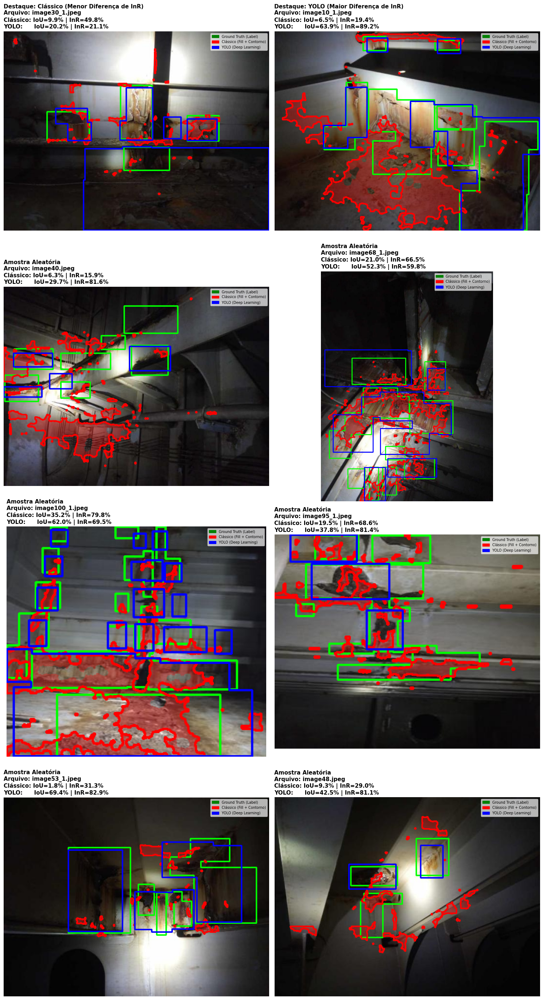

In [31]:
import matplotlib.patches as mpatches

# Configuração do Grid
n_total = len(display_list)
n_cols = 2
n_rows = (n_total + n_cols - 1) // n_cols 

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 7 * n_rows))
axes = axes.flatten()

# Legenda Personalizada
legend_patches = [
    mpatches.Patch(color='green', label='Ground Truth (Label)'),
    mpatches.Patch(color='red', label='Clássico (Fill + Contorno)'),
    mpatches.Patch(color='blue', label='YOLO (Deep Learning)')
]

for i, ax in enumerate(axes):
    if i >= n_total:
        ax.axis('off')
        continue

    row, category_title = display_list[i]
    
    # 1. Prepara a imagem base
    img_rgb = cv2.cvtColor(row['img_ref'], cv2.COLOR_BGR2RGB)
    
    # 2. APLICA O PREENCHIMENTO (PAINT) COM TRANSPARÊNCIA NO CLÁSSICO
    # Cria uma cópia para ser a camada de cor
    overlay = img_rgb.copy()
    
    # Pinta de vermelho [255, 0, 0] onde a máscara clássica > 0
    overlay[row['mask_classic'] > 0] = [255, 0, 0]
    
    # Mistura: 70% Imagem Original + 30% Overlay Vermelho (Alta transparência)
    img_vis = cv2.addWeighted(img_rgb, 0.7, overlay, 0.3, 0)
    
    # 3. Desenha Contornos por cima do Overlay (para ficarem nítidos)
    
    # Ground Truth (VERDE)
    cnt_gt, _ = cv2.findContours(row['mask_gt'], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img_vis, cnt_gt, -1, (0, 255, 0), 2)
    
    # Clássico (VERMELHO - Borda Sólida)
    cnt_cl, _ = cv2.findContours(row['mask_classic'], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img_vis, cnt_cl, -1, (255, 0, 0), 2)
    
    # YOLO (AZUL)
    cnt_yl, _ = cv2.findContours(row['mask_yolo'], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img_vis, cnt_yl, -1, (0, 0, 255), 2)
    
    # Plotagem
    ax.imshow(img_vis)
    
    # Título com Inside Ratio (InR) e IoU
    title_text = f"{category_title}\nArquivo: {row['Filename']}\n"
    title_text += f"Clássico: IoU={row['Classic_IoU']:.1%} | InR={row['Classic_Inside']:.1%}\n"
    title_text += f"YOLO:      IoU={row['YOLO_IoU']:.1%} | InR={row['YOLO_Inside']:.1%}"
    
    ax.set_title(title_text, fontsize=11, fontweight='bold', loc='left')
    ax.axis('off')
    
    # Adiciona a legenda
    ax.legend(handles=legend_patches, loc='upper right', fontsize='x-small', framealpha=0.7)

plt.tight_layout()
plt.show()